In [1]:
import random
from os import path

import numpy as np
import torch
import torchvision.transforms as transforms
from torchsummary import summary

import dataloaders
import networks.rcdcgan as rcdcgan
import networks.utils as utils
from sample_and_visualize import sample_and_visualize

### Setup CUDA / Multiprocessing related variables

In [2]:
USE_CUDA = True

if USE_CUDA and torch.cuda.is_available():
    device = 'cuda'  #alt: "cuda:0"
else:
    device = 'cpu'

PIN_MEMORY = True
USE_MULTI_PROCESS_DATA_LOADING = True
# Multi Process Data Loading
if USE_MULTI_PROCESS_DATA_LOADING:
    NUM_THREADS = torch.get_num_threads()
    print("Number of Threads: ", NUM_THREADS)
else:
    NUM_THREADS = 0
    print("Not using Multi-Process Data Loading.")

Number of Threads:  8


### Setup Parameters

In [3]:
SEED = 0
random.seed(SEED)
torch.manual_seed(SEED);

In [4]:
### Data
DATA_PATH = path.join("data", "tmdb-128")
TABLE_PATH = path.join("data", "tmdb-movies-220915-clean.pkl")

### Architecture
IMAGE_SIZE = 128
IMAGE_SIZE_RATIO = 3  # height/width
NUM_IMG_CHANNELS = 3
NUM_NOISE_VEC_CHANNELS = 128
NUM_FEATURE_VEC_CHANNELS = 37
BASE_NUM_OUT_CHANNELS_G = 64
BASE_NUM_OUT_CHANNELS_D = 64
PADDING_MODE = "reflect"
COLORMODE = "RGB"

### Training
BATCH_SIZE = 32
NUM_EPOCHS = 101
LEARNING_RATE = 0.0002
BETA1 = 0.5
BETA2 = 0.999

### Visualization
NUM_SAMPLES = 32

### Saving
OUT_PATH = path.join("output-runs", "racdcgan-output")
SAVE_MODEL_EVERY_N_EPOCHS = 10
SAVE_FAKES_EVERY_N_EPOCHS = 5

MODEL_TO_LOAD = path.join(OUT_PATH, "2022-09-26_02-19-48/gan_at_epoch_0030.pt")
#MODEL_TO_LOAD = None

### Load dataset

In [5]:
# Poster subset:
GENRE = None
GENRE_LOGIC = 'and'
OG_LANG = None
YEAR = None
RUNTIME = (40, np.inf)
MAX_NUM = None
SORT = None

# define dataset
poster_dataset = dataloaders.PosterDataset(table_path=TABLE_PATH, img_root_path=DATA_PATH,
                                           img_transform=transforms.Compose([
                                               transforms.ToTensor(),
                                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
                                           colormode=COLORMODE,
                                           img_in_ram=False,
                                           genre=GENRE, genre_logic=GENRE_LOGIC, og_lang=OG_LANG, year=YEAR,
                                           runtime=RUNTIME,
                                           max_num=MAX_NUM, sort=SORT)
posterloader = torch.utils.data.DataLoader(poster_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_THREADS,
                                           pin_memory=PIN_MEMORY)

Sample dataset:

The dataset has 224094 entries.


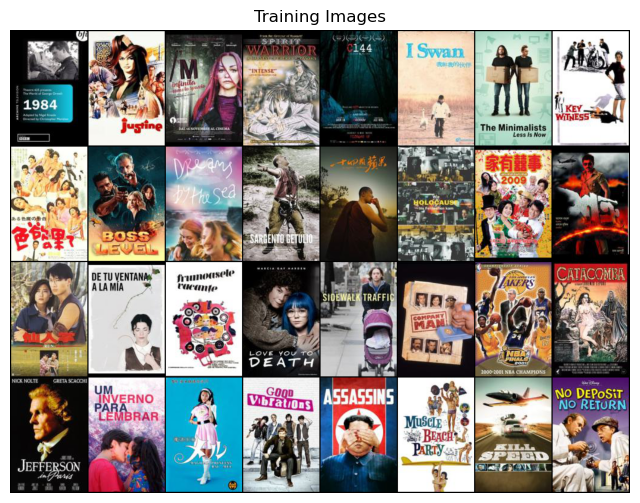

In [6]:
sample_reals = utils.sample_posters(posterloader, number_of_samples=NUM_SAMPLES, colormode=COLORMODE, device=device)
sample_labels = torch.stack(sample_reals[6:(6 + NUM_FEATURE_VEC_CHANNELS)], dim=1).type(torch.FloatTensor).to(device)[
                :NUM_SAMPLES]
sample_labels_generator = sample_labels[:, :, None, None].expand(NUM_SAMPLES, NUM_FEATURE_VEC_CHANNELS,
                                                                 IMAGE_SIZE_RATIO, 1)
print('The dataset has ' + str(len(poster_dataset)) + ' entries.');

### Initialize Network

In [7]:
generator, discriminator = rcdcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                              num_img_channels=NUM_IMG_CHANNELS,
                                              num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS,
                                              base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G,
                                              base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                              padding_mode=PADDING_MODE,
                                              device=device)

print("Generator:")
summary(generator, input_size=[(NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, 1),(NUM_FEATURE_VEC_CHANNELS, IMAGE_SIZE_RATIO, 1)])
print("\nDiscriminator:")
summary(discriminator, input_size=[(NUM_IMG_CHANNELS, IMAGE_SIZE * IMAGE_SIZE_RATIO // 2, IMAGE_SIZE), (NUM_FEATURE_VEC_CHANNELS, IMAGE_SIZE * IMAGE_SIZE_RATIO // 2, IMAGE_SIZE)])

Generator:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 6, 4]       1,048,576
       BatchNorm2d-2            [-1, 512, 6, 4]           1,024
              ReLU-3            [-1, 512, 6, 4]               0
   ConvTranspose2d-4            [-1, 512, 6, 4]         303,104
       BatchNorm2d-5            [-1, 512, 6, 4]           1,024
              ReLU-6            [-1, 512, 6, 4]               0
   ConvTranspose2d-7           [-1, 512, 12, 8]       8,388,608
       BatchNorm2d-8           [-1, 512, 12, 8]           1,024
              ReLU-9           [-1, 512, 12, 8]               0
  ConvTranspose2d-10          [-1, 256, 24, 16]       2,097,152
      BatchNorm2d-11          [-1, 256, 24, 16]             512
             ReLU-12          [-1, 256, 24, 16]               0
  ConvTranspose2d-13          [-1, 128, 48, 32]         524,288
      BatchNorm2d-14        

In [8]:
trainer = rcdcgan.create_trainer(out_dir=OUT_PATH, num_samples=NUM_SAMPLES,
                                 colormode=COLORMODE,
                                 num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                 image_size=IMAGE_SIZE,
                                 image_size_ratio=IMAGE_SIZE_RATIO,
                                d_params=discriminator.parameters(), g_params=generator.parameters(),
                                learning_rate=LEARNING_RATE, beta1=BETA1, beta2=BETA2, device=device)

## Train

In [9]:
SHOW_GRAPHS = False
trainer.train(generator, discriminator, dataloader=posterloader, num_epochs=NUM_EPOCHS, device=device,
              num_features=NUM_FEATURE_VEC_CHANNELS, sample_labels_generator=sample_labels_generator,
              fake_img_snap=SAVE_FAKES_EVERY_N_EPOCHS, model_snap=SAVE_MODEL_EVERY_N_EPOCHS,
              model_to_load=MODEL_TO_LOAD, show_graphs=SHOW_GRAPHS)

[0/100]	Loss_D: 0.4508	Loss_G: 31.5325	D(x): 1.7646	D(G(z)): 1.4361 / -2.7629:   0%|          | 9/7003 [00:16<3:28:29,  1.79s/it] 


KeyboardInterrupt: 

### Show results

In [ ]:
utils.plot_reals_vs_fakes(generator, trainer, sample_reals, NUM_SAMPLES,
                          path.join(trainer.last_out_dir, "real_vs_fake.png"), device, sample_labels_generator=sample_labels_generator)

In [9]:
checkpoint = torch.load(MODEL_TO_LOAD)
generator.load_state_dict(checkpoint['generator_model_state_dict'])

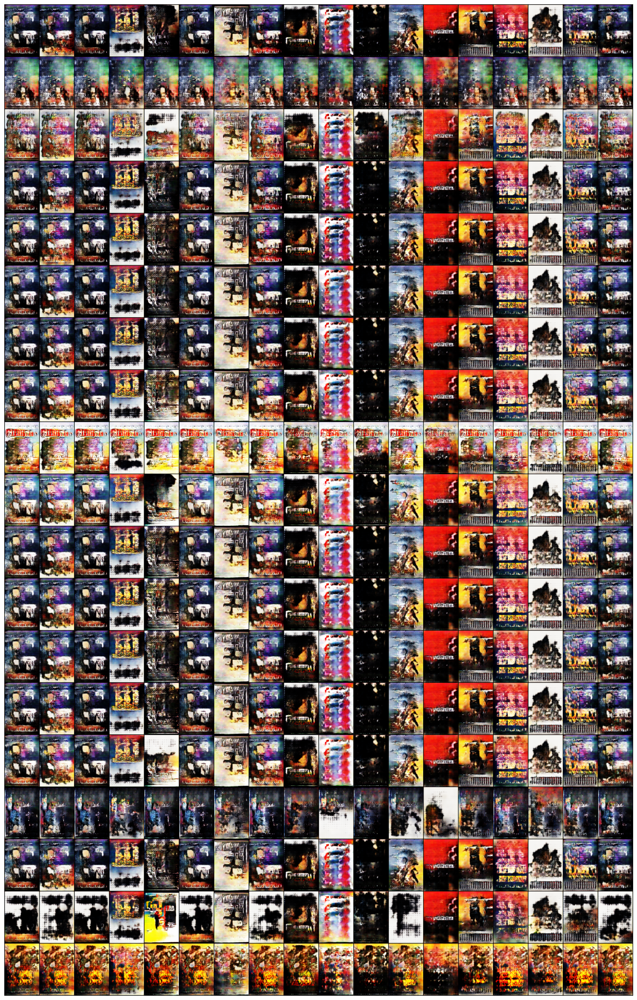

In [13]:
seed = 500
utils.plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30,
                output=path.join("output-runs", "racdcgan-output", "2022-09-26_02-19-48", "conditional_grid.png"))
#utils.plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30,
#                output=path.join(trainer.last_out_dir, "conditional_grid.png"))

In [ ]:
#sample_and_visualize(generator, NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, 5, device, 0.01)